In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import preprocessing as pp
from sklearn import metrics as m
from sklearn import base as b
from sklearn import utils as u

from catboost import CatBoostClassifier

import optuna
import joblib 

import time
import serial 
from IPython.display import clear_output
from datetime import datetime as dt
import os
import warnings

plt.style.use('bmh')
warnings.filterwarnings('ignore')

RS = 8 #random_state

c:\Users\honor\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# IO utils


In [2]:
def read_omg_csv(path_palm_data: str, 
                 n_omg_channels: int = 50,
                 n_acc_channels: int = 3, 
                 n_gyr_channels: int = 3, 
                 n_enc_channels: int = 6, 
                 n_mag_channels: int = 0,
                 button_ch: bool = True, 
                 sync_ch: bool = True, 
                 timestamp_ch: bool = True) -> pd.DataFrame:
    
    '''
    Reads CSV data for OMG data
    NB: data must be separated by " " separator

    Parameters:
    ---ы
        path_palm_data  (str): path to csv data file
        n_omg_channels  (int): Number of OMG channels
        n_acc_channels  (int): Number of Accelerometer channels,      default = 0
        n_gyr_channels  (int): Number of Gyroscope channels,          default = 0
        n_mag_channels  (int): Number of Magnetometer channels,       default = 0
        n_enc_channels  (int): Number of Encoder channels,            default = 0
        button_ch      (bool): If button channel is present,          default = True
        sync_ch        (bool): If synchronization channel is present, default = True
        timestamp_ch   (bool): If timestamp channel is present,       default = True

    Returns:
    ---
        df_raw (pd.DataFrame): Parsed pandas Dataframe with OMG data
    '''
    
    df_raw = pd.read_csv(path_palm_data, sep=' ', 
                         header=None, 
                         skipfooter=1, 
                         skiprows=1, 
                         engine='python')
    columns = np.arange(n_omg_channels).astype('str').tolist()
    
    for label, label_count in zip(['ACC', 'GYR', 'MAG', 'ENC'], 
                                  [n_acc_channels, n_gyr_channels, n_mag_channels, n_enc_channels]):
        columns = columns + ['{}{}'.format(label, i) for i in range(label_count)]
        
    if button_ch:
        columns = columns + ['BUTTON']
        
    if sync_ch:
        columns = columns + ['SYNC']
        
    if timestamp_ch:
        columns = columns + ['ts']
        
    df_raw.columns = columns
    
    return df_raw

# Data

**Abbreviations**
* OMG — optomiography  
* ACC — accelerometer  
* GYR — gyroscope  
* ENC — encoders (fingers of prosthesis or gloves)  
* model — model of data  

**X features**
* '0', ..., '49' - каналы OMG датчиков
* 'ACC0', 'ACC1', 'ACC2' - акселерометр (потенциально могут использоваться как факторы для модели)
* 'GYR0', 'GYR1', 'GYR2' - гироскоп     (потенциально могут использоваться как факторы для модели)
* 'BUTTON' - не используется
* 'SYNC' - синхронизация данных с протоколом
* 'ts' - метка времени

In [3]:
datas = []

for dirname, _, filenames in os.walk('.\data'):
    for filename in filenames:
        datas.append(os.path.join(dirname, filename))

datas = list(filter(lambda x: True if 'protocol' not in x else False, datas))


data_names = []

for path in datas:    
    d_path = path.split('\\')[-1]
    
    data_names.append(d_path)

data_names.remove('meta_information.csv')


data_names

['2023-04-18_19-08-47 gestures train.palm',
 '2023-05-05_17-57-30.palm',
 '2023-05-07_15-19-05.palm',
 '2023-05-07_16-54-27.palm',
 '2023-05-12_19-17-00.palm',
 '2023-05-15_16-16-08.palm',
 '2023-05-15_17-12-24.palm',
 '2023-05-19_12-04-02.palm',
 '2023-05-22_17-04-29.palm',
 '2023-05-22_20-22-01.palm',
 '2023-05-31_15-46-37.palm',
 '2023-05-31_17-14-41.palm',
 '2023-06-05_16-12-38.palm',
 '2023-06-05_17-53-01.palm',
 '2023-06-20_12-34-17.palm',
 '2023-06-20_13-30-15.palm',
 '2023-06-20_14-43-11.palm',
 '2023-09-12_12-55-22.palm',
 '2023-09-12_14-59-23.palm',
 '2023-09-13_22-14-05.palm',
 '2023-09-29_09-20-47.palm',
 '2023-09-29_11-03-50.palm',
 '2023-09-30_08-06-44.palm',
 '2023-10-18_08-05-29.palm',
 '2023-10-18_11-16-21.palm',
 '2023-10-23_10-11-45.palm',
 '2023-10-23_14-07-13.palm',
 '2023-10-23_16-23-02.palm',
 '2023-10-25_08-52-30.palm',
 '2023-10-25_11-08-46.palm',
 'patched_2023-10-25_09-44-02.palm']

In [4]:
palm_file = './data/' + data_names[0]
gestures = read_omg_csv(palm_file)

gestures

,0,1,2,3,4,5,6,7,8,9,...,GYR2,ENC0,ENC1,ENC2,ENC3,ENC4,ENC5,BUTTON,SYNC,ts
0,10,8,28,2846,2931,2873,2597,24,8,13,...,31,0,0,0,0,0,0,0,0,1174989
1,16,8,29,2847,2930,2875,2598,24,8,6,...,31,0,0,0,0,0,0,0,0,1175022
2,10,8,29,2847,2930,2875,2598,25,8,5,...,30,0,0,0,0,0,0,0,0,1175055
3,0,8,29,2845,2927,2870,2594,24,8,6,...,30,0,0,0,0,0,0,0,0,1175088
4,9,8,25,2851,2933,2877,2599,24,8,6,...,28,0,0,0,0,0,0,0,0,1175121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37603,10,5,17,2369,2498,2677,2425,20,8,5,...,31,0,0,0,0,0,0,0,0,2415888
37604,10,7,21,2400,2529,2697,2441,21,17,6,...,30,0,0,0,0,0,0,0,0,2415921
37605,10,6,21,2429,2557,2713,2454,19,7,5,...,33,0,0,0,0,0,0,0,0,2415954
37606,0,7,18,2446,2565,2720,2459,22,8,6,...,31,0,0,0,0,0,0,0,0,2415987


In [5]:
print(f"All columns:\n{gestures.columns}\n")

OMG_CH = [str(i) for i in range(50)]
ACC_CH = ['ACC0', 'ACC1', 'ACC2']
GYR_CH = ['GYR0', 'GYR1', 'GYR2']
ENC_CH = ['ENC0', 'ENC1', 'ENC2', 'ENC3', 'ENC4', 'ENC5']
BUTTON_SYNC_TS_CH = ['BUTTON', 'SYNC', 'ts']

assert len(OMG_CH)+len(ACC_CH)+len(GYR_CH)+len(ENC_CH)+len(BUTTON_SYNC_TS_CH) == gestures.shape[1]

print(f"OMG_CH: {list(OMG_CH)}")
print(f"ACC_CH: {list(ACC_CH)}")
print(f"GYR_CH: {list(GYR_CH)}")
print(f"ENC_CH: {list(ENC_CH)}")
print(f"BUTTON_SYNC_TS_CH: {list(BUTTON_SYNC_TS_CH)}")

All columns:
Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36',
       '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48',
       '49', 'ACC0', 'ACC1', 'ACC2', 'GYR0', 'GYR1', 'GYR2', 'ENC0', 'ENC1',
       'ENC2', 'ENC3', 'ENC4', 'ENC5', 'BUTTON', 'SYNC', 'ts'],
      dtype='object')

OMG_CH: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49']
ACC_CH: ['ACC0', 'ACC1', 'ACC2']
GYR_CH: ['GYR0', 'GYR1', 'GYR2']
ENC_CH: ['ENC0', 'ENC1', 'ENC2', 'ENC3', 'ENC4', 'ENC5']
BUTTON_SYNC_TS_CH: ['BUTTON', 'SYNC', 'ts']


In [6]:
gestures_omg_ch = gestures[OMG_CH]

gestures_omg_ch

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
0,10,8,28,2846,2931,2873,2597,24,8,13,...,32,28,10,11,8,5,8,13,32,25
1,16,8,29,2847,2930,2875,2598,24,8,6,...,33,31,10,12,8,5,9,14,36,28
2,10,8,29,2847,2930,2875,2598,25,8,5,...,11,30,11,12,8,7,8,14,36,28
3,0,8,29,2845,2927,2870,2594,24,8,6,...,33,32,10,12,0,6,10,14,36,28
4,9,8,25,2851,2933,2877,2599,24,8,6,...,32,29,10,11,6,5,9,13,33,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37603,10,5,17,2369,2498,2677,2425,20,8,5,...,28,25,10,10,7,6,9,13,34,24
37604,10,7,21,2400,2529,2697,2441,21,17,6,...,30,24,10,10,7,5,8,11,35,25
37605,10,6,21,2429,2557,2713,2454,19,7,5,...,28,24,18,9,7,5,9,13,33,25
37606,0,7,18,2446,2565,2720,2459,22,8,6,...,12,26,11,8,7,6,9,15,36,27


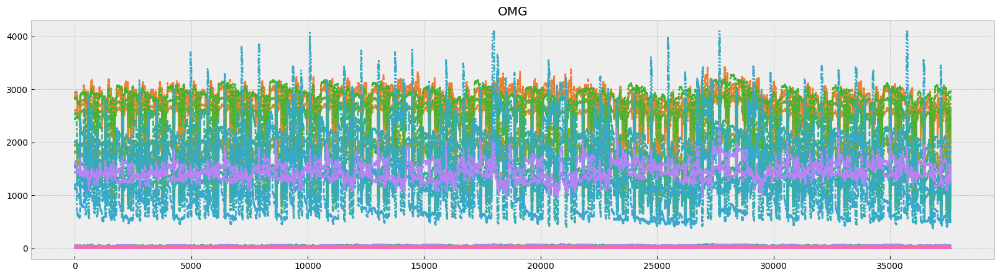

In [7]:
plt.figure(figsize=(20, 5))
sns.lineplot(gestures_omg_ch, legend=False)

plt.title('OMG')
plt.show()

# Protocol

In [8]:
gestures_protocol = pd.read_csv(f'{palm_file}.protocol.csv', index_col=0)

gestures_protocol

,Thumb,Index,Middle,Ring,Pinky,Thumb_stretch,Index_stretch,Middle_stretch,Ring_stretch,Pinky_stretch,Pronation
epoch,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
302,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
303,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
304,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0


In [9]:
le = pp.LabelEncoder()

# FIT & TRANSFORM
gestures_protocol['gesture'] = le.fit_transform(
    gestures_protocol[[
        "Thumb", "Index", "Middle", "Ring", "Pinky",
        'Thumb_stretch', 'Index_stretch', 'Middle_stretch', 'Ring_stretch', 'Pinky_stretch'
    ]]
    .apply(lambda row: str(tuple(row)), axis=1)
)

display(np.c_[le.transform(le.classes_), le.classes_])

gestures_protocol['gesture']

array([[0, '(0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [1, '(0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0)'],
       [2, '(0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [3, '(1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [4, '(1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)'],
       [5, '(1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0)']],
      dtype=object)

epoch
0      0
1      0
2      3
3      5
4      1
      ..
302    3
303    5
304    1
305    4
306    2
Name: gesture, Length: 307, dtype: int32

In [10]:
GESTURES = ['Neutral', 'Open', 'Pistol', 'Thumb', 'OK', 'Grab']
NUM_G = len(GESTURES)

GESTURES, NUM_G

(['Neutral', 'Open', 'Pistol', 'Thumb', 'OK', 'Grab'], 6)

In [11]:
def read_protocol_csv(palm_file, gestures):
    gestures_protocol = pd.read_csv(f'{palm_file}.protocol.csv', index_col=0)
    
    le = pp.LabelEncoder()

    gestures_protocol['gesture'] = le.fit_transform(
        gestures_protocol[[
            "Thumb", "Index", "Middle", "Ring", "Pinky",
            'Thumb_stretch', 'Index_stretch', 'Middle_stretch', 'Ring_stretch', 'Pinky_stretch'
        ]]
        .apply(lambda row: str(tuple(row)), axis=1)
    )
    
    y_cmd = pd.Series([gestures_protocol['gesture'].loc[s] for s in gestures['SYNC'].values])
    
    return y_cmd


y_cmd = read_protocol_csv(palm_file, gestures)

y_cmd

0        0
1        0
2        0
3        0
4        0
        ..
37603    0
37604    0
37605    0
37606    0
37607    0
Length: 37608, dtype: int32

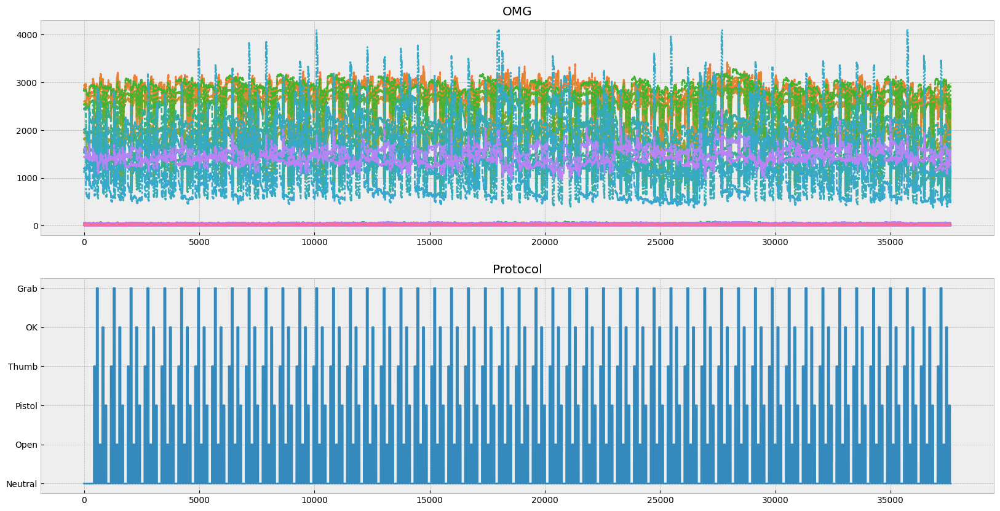

In [12]:
fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(gestures_omg_ch, legend=False, ax=ax[0])
ax[0].set_title('OMG')

sns.lineplot(y_cmd, ax=ax[1])
ax[1].set_title('Protocol')
ax[1].set_yticks(range(NUM_G), GESTURES)

plt.show()

# Preprocessing

In [13]:
binarise_y = lambda x: 1 if x != 0 else x 


def get_disp_sum(data):
    data_scaled = (data - data.mean()) / data.std()
    
    dispersion = pd.DataFrame(data_scaled, columns=data.columns)
    disp_sum = dispersion.abs().sum(axis=1)
    
    return disp_sum

### Shifting

Best shifting value: 16


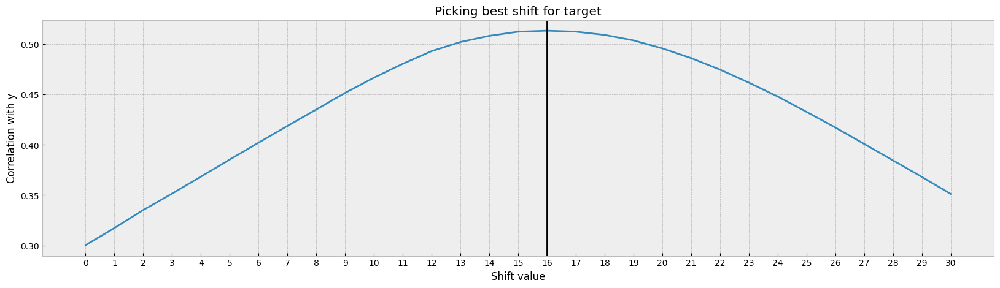

In [14]:
shift_targ = lambda targ, shift: pd.Series(targ).shift(shift).fillna(0)


def select_shift(data, targ=y_cmd, plot=False):
    shift_corr = pd.Series() 
    
    disp = get_disp_sum(data)
    t_bin = targ.apply(binarise_y)
    
    shift_range = range(31)
    for shift_value in shift_range:  
        shifted_y = shift_targ(t_bin, shift_value)
        shift_corr.loc[shift_value] = abs(disp.corr(shifted_y))
    
    best_shift = shift_corr.sort_values(ascending=False).index[0]
    
    if plot:
        print('Best shifting value:', best_shift)
        
        plt.figure(figsize=(20, 5))
        sns.lineplot(shift_corr)

        plt.xticks(shift_range)
        plt.axvline(best_shift, color='black')
        
        plt.xlabel('Shift value')
        plt.ylabel('Correlation with y')
        plt.title('Picking best shift for target')
        
        plt.show()
    
    return int(best_shift)


best_shift = select_shift(gestures_omg_ch, plot=True)

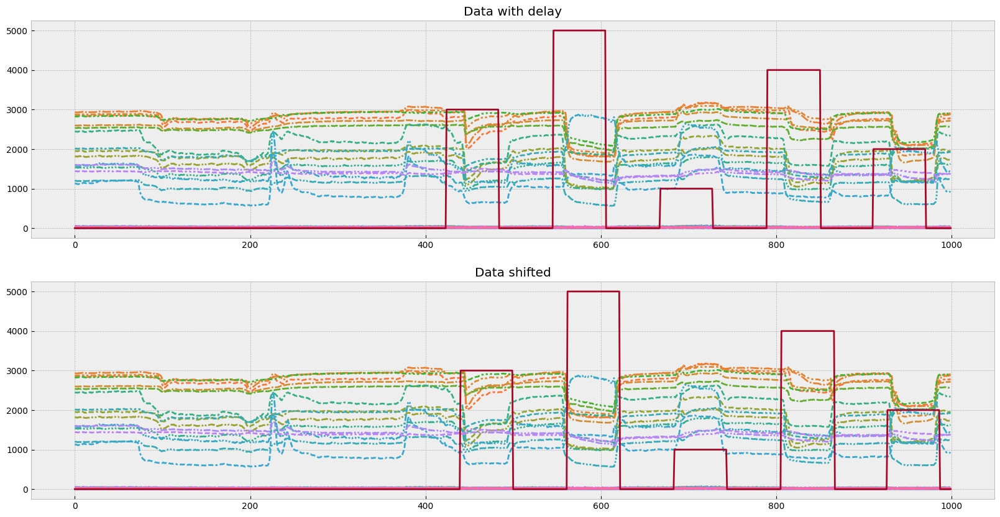

In [15]:
fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(gestures_omg_ch.iloc[:1000], 
             legend=False, 
             ax=ax[0])
sns.lineplot(y_cmd.iloc[:1000]*1000, ax=ax[0])
ax[0].set_title('Data with delay')


y_shifted = shift_targ(y_cmd, best_shift)

sns.lineplot(gestures_omg_ch.iloc[:1000], 
             legend=False, 
             ax=ax[1])
sns.lineplot(y_shifted.iloc[:1000]*1000, ax=ax[1])
ax[1].set_title('Data shifted')


fig.show()

### Smoothing

Best window value: 4


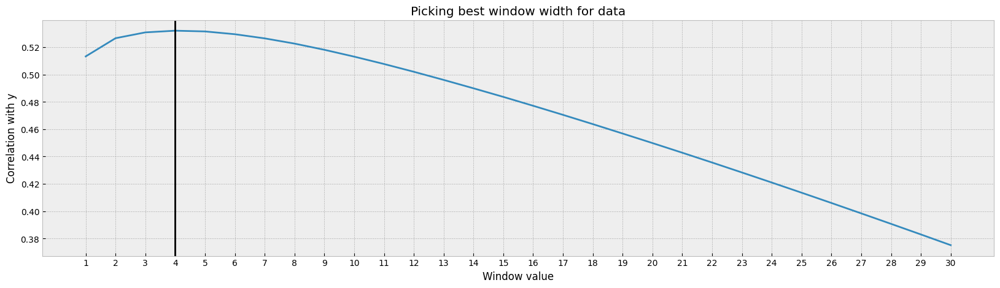

In [16]:
smoothe_data = lambda X, win: pd.DataFrame(X).rolling(win, 1).mean()


def select_window(data, targ=y_shifted, plot=False):
    smooth_corr = pd.Series()
    
    t_bin = targ.apply(binarise_y)
    disp = get_disp_sum(data)

    win_range = range(1, 31)
    for win_value in win_range:      
        smoothed_disp = smoothe_data(disp, win_value)[0]
        smooth_corr.loc[win_value] = abs(smoothed_disp.corr(t_bin))
        
    best_win = smooth_corr.sort_values(ascending=False).index[0]
    
    if plot:
        print('Best window value:', best_win)
        
        plt.figure(figsize=(20, 5))
        sns.lineplot(smooth_corr)
        
        plt.xticks(win_range)
        plt.axvline(best_win, color='black')
        
        plt.xlabel('Window value')
        plt.ylabel('Correlation with y')
        plt.title('Picking best window width for data')
        
        plt.show()
    
    return int(best_win)


best_win = select_window(gestures_omg_ch, plot=True)

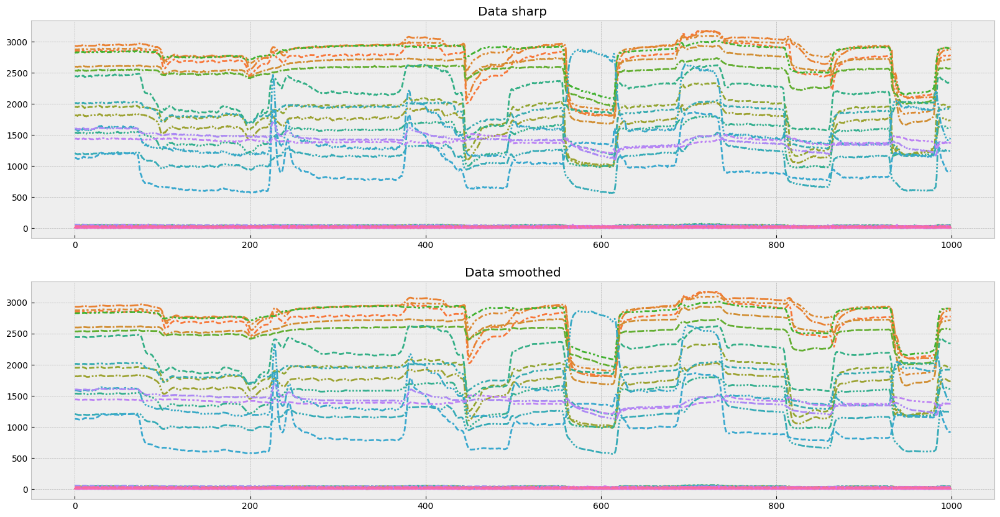

In [17]:
fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(gestures_omg_ch.iloc[:1000], 
             legend=False, 
             ax=ax[0])
ax[0].set_title('Data sharp')


gestures_smoothed = smoothe_data(gestures_omg_ch, best_win)

sns.lineplot(gestures_smoothed.iloc[:1000], 
             legend=False, 
             ax=ax[1])
ax[1].set_title('Data smoothed')


fig.show()

# Modeling 

### Train-test split

In [18]:
df_meta = pd.read_csv('./data/meta_information.csv', index_col=0)

df_meta.head()

,montage,pilote_id,last_train_idx,len(train),len(test)
0,2023-05-15_16-16-08.palm,1,23337,23337,5810
1,2023-05-15_17-12-24.palm,1,23336,23336,5803
2,2023-06-05_16-12-38.palm,1,17939,17939,4431
3,2023-06-05_17-53-01.palm,1,17771,17771,4435
4,2023-06-20_14-43-11.palm,1,17936,17936,4441


(29548, 50) (29548,)
(8060, 50) (8060,)


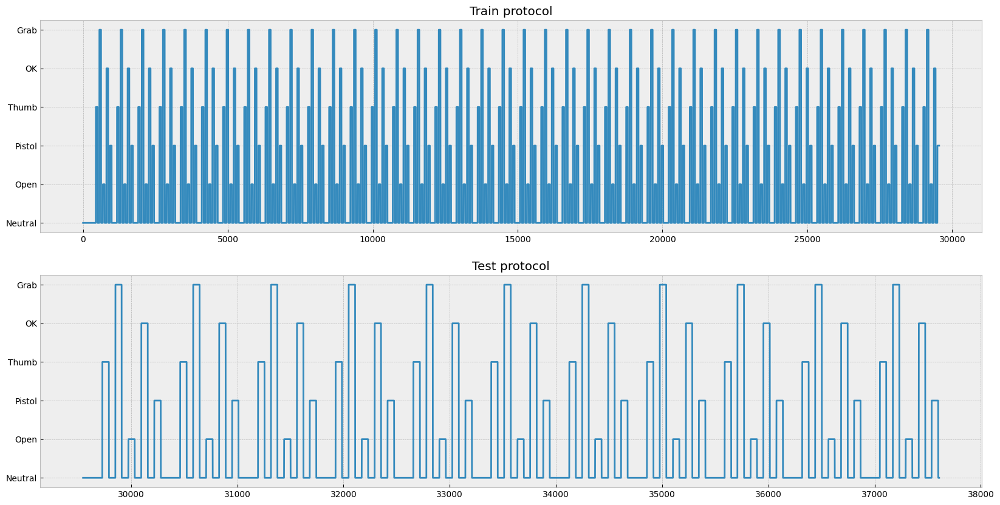

In [19]:
def train_test_split(palm_file, X, y, shift):
    palm_mask = df_meta['montage'] == palm_file.split('/')[-1]
    
    last_train_idx = df_meta[palm_mask]['last_train_idx'].values[0]+shift
    pilote_id = df_meta[palm_mask]['pilote_id'].values[0]
    
    X_train = X.iloc[:last_train_idx]
    y_train = y.iloc[:last_train_idx]

    X_test = X.iloc[last_train_idx:]
    y_test = y.iloc[last_train_idx:]
    
    return (X_train, X_test, 
            y_train, y_test, 
            last_train_idx, pilote_id) 


X_train, X_test, y_train, y_test = train_test_split(
    palm_file, gestures_smoothed, y_shifted, best_shift
)[:4]

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)


fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(y_train, ax=ax[0])
sns.lineplot(y_test, ax=ax[1])

ax[0].set_yticks(range(len(GESTURES)), GESTURES)
ax[0].set_title('Train protocol')

ax[1].set_yticks(range(len(GESTURES)), GESTURES)
ax[1].set_title('Test protocol')

fig.show()

### Multiple datasets

**Picking best datasets**

In [20]:
data_scores = pd.DataFrame(
    columns=['corr', 'shift', 'window', 'id']
)

for palm in data_names:
    X = read_omg_csv('data/'+palm)
    y = read_protocol_csv('data/'+palm, X)
    X_omg = X[OMG_CH]
    
    shift = select_shift(X_omg, y)
    y_sh = shift_targ(y, shift)
    data_scores.loc[palm, 'shift'] = shift
    
    window = select_window(X_omg, y_sh)
    X_sm = smoothe_data(X_omg, window)
    data_scores.loc[palm, 'window'] = window
    
    X, X_, y, y_, last_i, p_id = train_test_split(
        palm, X_sm, y_sh, shift
    )
    
    disp = get_disp_sum(X)
    
    data_scores.loc[palm, 'id'] = p_id
    data_scores.loc[palm, 'corr'] = abs(disp.corr(y))
    
    print(f'[{dt.now()}] Session with {palm} is done.')

[2024-03-21 01:19:56.516564] Session with 2023-04-18_19-08-47 gestures train.palm is done.
[2024-03-21 01:19:58.150330] Session with 2023-05-05_17-57-30.palm is done.
[2024-03-21 01:19:58.734335] Session with 2023-05-07_15-19-05.palm is done.
[2024-03-21 01:19:59.288972] Session with 2023-05-07_16-54-27.palm is done.
[2024-03-21 01:20:00.090207] Session with 2023-05-12_19-17-00.palm is done.
[2024-03-21 01:20:01.439829] Session with 2023-05-15_16-16-08.palm is done.
[2024-03-21 01:20:03.044371] Session with 2023-05-15_17-12-24.palm is done.
[2024-03-21 01:20:04.452399] Session with 2023-05-19_12-04-02.palm is done.
[2024-03-21 01:20:06.001777] Session with 2023-05-22_17-04-29.palm is done.
[2024-03-21 01:20:06.930701] Session with 2023-05-22_20-22-01.palm is done.
[2024-03-21 01:20:07.921857] Session with 2023-05-31_15-46-37.palm is done.
[2024-03-21 01:20:08.837742] Session with 2023-05-31_17-14-41.palm is done.
[2024-03-21 01:20:09.883490] Session with 2023-06-05_16-12-38.palm is don

In [21]:
data_scores.sort_values('corr', ascending=False, inplace=True)

data_scores

,corr,shift,window,id
2023-04-18_19-08-47 gestures train.palm,0.583644,16,4,3
2023-05-22_20-22-01.palm,0.57057,17,6,2
2023-05-05_17-57-30.palm,0.552892,15,6,4
2023-10-23_10-11-45.palm,0.548617,17,3,2
2023-05-07_16-54-27.palm,0.542059,13,6,3
2023-05-31_17-14-41.palm,0.496667,20,5,2
2023-05-31_15-46-37.palm,0.490291,19,5,2
2023-09-29_11-03-50.palm,0.480574,17,3,2
2023-09-30_08-06-44.palm,0.45275,16,3,2
2023-05-22_17-04-29.palm,0.447762,17,4,2


In [22]:
data_names_best = data_scores[data_scores['corr'] >= 0.5].index.to_list()

data_names_best

['2023-04-18_19-08-47 gestures train.palm',
 '2023-05-22_20-22-01.palm',
 '2023-05-05_17-57-30.palm',
 '2023-10-23_10-11-45.palm',
 '2023-05-07_16-54-27.palm']

**Concatenating them**

In [23]:
def prepare_data(palm):
    X = read_omg_csv('data/'+palm)
    y = read_protocol_csv('data/'+palm, X)
    X_omg = X[OMG_CH]
    
    shift = select_shift(X_omg, y)
    y_sh = shift_targ(y, shift)
    
    win = select_window(X_omg, y_sh)
    X_sm = smoothe_data(X_omg, win)
    
    X_train, X_test, y_train, y_test = train_test_split(
        palm, X_sm, y_sh, shift
    )[:4]
    
    return X_train, X_test, y_train, y_test


concat_df = lambda d1, d2: pd.concat([d1, d2], axis=0, ignore_index=True)

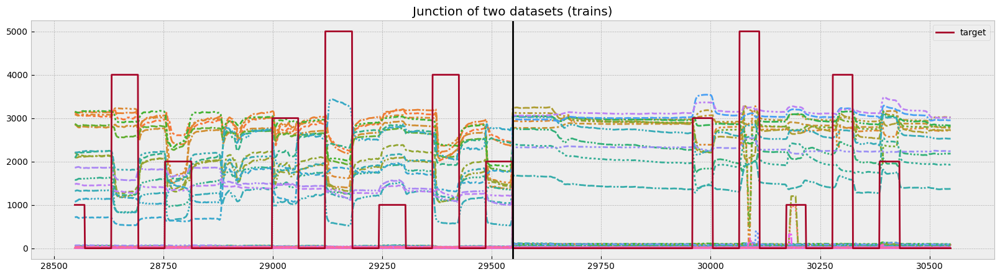

In [24]:
X_train_2, X_test_2, y_train_2, y_test_2 = prepare_data(data_names_best[1])

X_train_conc = concat_df(X_train, X_train_2)
y_train_conc = concat_df(y_train, y_train_2)
X_test_conc = concat_df(X_test, X_test_2)
y_test_conc = concat_df(y_test, y_test_2)


split_i = X_train.shape[0]
BOUND = 1000

plt.figure(figsize=(20, 5))
sns.lineplot(X_train_conc.loc[split_i-BOUND : split_i+BOUND], legend=False)
sns.lineplot(y_train_conc.loc[split_i-BOUND : split_i+BOUND]*1000, label='target')

plt.axvline(split_i, color='black')
plt.title('Junction of two datasets (trains)')
plt.show()

Old shape: 29548
New shape: 45167 (+15619)
New shape: 65938 (+20771)
New shape: 71632 (+5694)
New shape: 77392 (+5760)


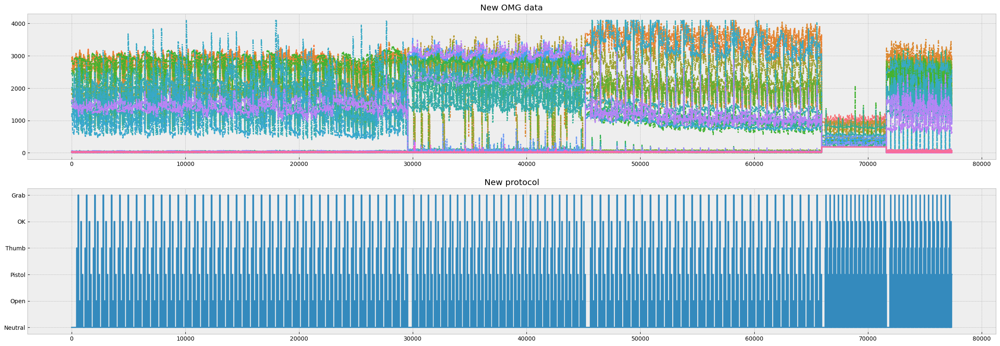

In [25]:
X_train_conc, X_test_conc = X_train.copy(), X_test.copy()
y_train_conc, y_test_conc = y_train.copy(), y_test.copy()

print('Old shape:', X_train_conc.shape[0])


for palm in data_names_best[1:]:
    X_train_2, X_test_2, y_train_2, y_test_2 = prepare_data(palm)

    X_train_conc = concat_df(X_train_conc, X_train_2)
    y_train_conc = concat_df(y_train_conc, y_train_2)
    X_test_conc = concat_df(X_test_conc, X_test_2)
    y_test_conc = concat_df(y_test_conc, y_test_2)
    
    print(f'New shape: {X_train_conc.shape[0]} (+{X_train_2.shape[0]})')
    

fig, ax = plt.subplots(2, 1, figsize=(30, 10))

sns.lineplot(X_train_conc, legend=False, ax=ax[0])
ax[0].set_title('New OMG data')

sns.lineplot(y_train_conc, ax=ax[1])
ax[1].set_title('New protocol')
ax[1].set_yticks(range(NUM_G), GESTURES)

fig.show()

### Baseline

In [26]:
fit_model = lambda Xy_set, model: model.fit(Xy_set[0], 
                                            Xy_set[2], 
                                            eval_set=(Xy_set[1], Xy_set[3]), 
                                            early_stopping_rounds=10, 
                                            verbose=False)


def model_score(model, Xy_set, sample=('train', 'test'), fitted=False):    
    if sample == 'train':
        X, y = Xy_set[0], Xy_set[2]
    elif sample == 'test':
        X, y = Xy_set[1], Xy_set[3]
    else:
        raise ValueError('No such sample')
    
    if not fitted:
        model = fit_model(Xy_set, model)

    y_ = model.predict(X).reshape(1, -1)[0]    
    score = m.f1_score(y, y_, average='macro') * 100
    
    return float(score) if len(set(y_)) == NUM_G else 0

In [27]:
params = dict(
    iterations = 10000, 
    eval_metric = 'TotalF1', 
    classes_count = NUM_G, 
    random_state = RS, 
    allow_writing_files = False
)

model = CatBoostClassifier(**params)


Xy_set = (X_train_conc, 
          X_test_conc, 
          y_train_conc, 
          y_test_conc)

BASELINE_SCORE = model_score(model, Xy_set, 'test')


print('Baseline score:', BASELINE_SCORE)

Baseline score: 49.90217152147634


### Median based concatenation

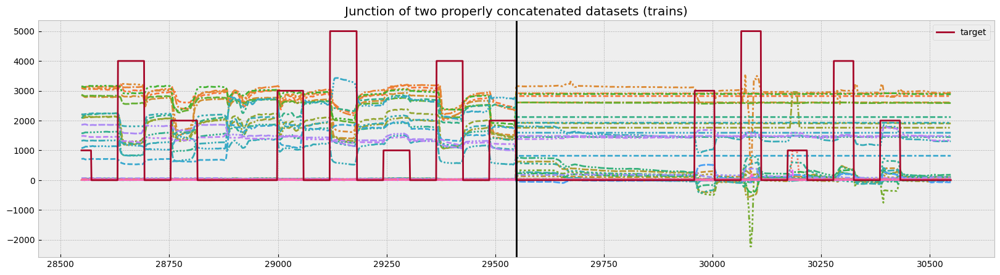

In [28]:
X_train_2, X_test_2, y_train_2, y_test_2 = prepare_data(data_names_best[1])

median_diff = X_train.median() - X_train_2.median()

X_train_conc = concat_df(X_train, X_train_2+median_diff)
y_train_conc = concat_df(y_train, y_train_2)
X_test_conc = concat_df(X_test, X_test_2+median_diff)
y_test_conc = concat_df(y_test, y_test_2)


plt.figure(figsize=(20, 5))
sns.lineplot(X_train_conc.loc[split_i-BOUND : split_i+BOUND], legend=False)
sns.lineplot(y_train_conc.loc[split_i-BOUND : split_i+BOUND]*1000, label='target')

plt.axvline(split_i, color='black')
plt.title('Junction of two properly concatenated datasets (trains)')
plt.show()

Old shape: 29548
New shape: 45167 (+15619)
New shape: 65938 (+20771)
New shape: 71632 (+5694)
New shape: 77392 (+5760)


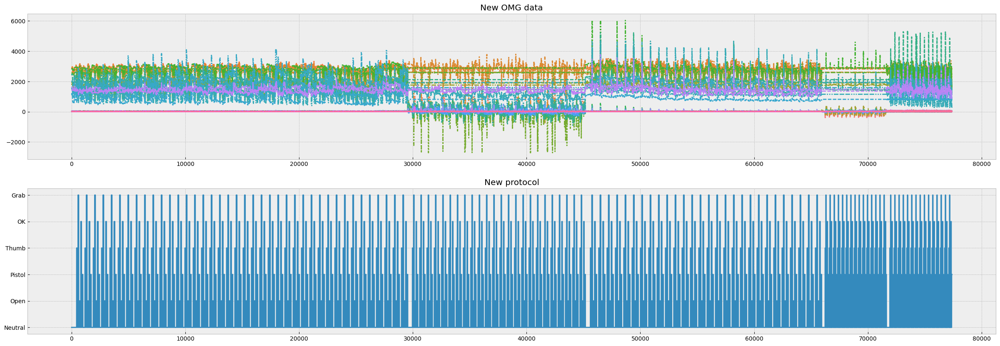

In [29]:
X_train_conc, X_test_conc = X_train.copy(), X_test.copy()
y_train_conc, y_test_conc = y_train.copy(), y_test.copy()

print('Old shape:', X_train_conc.shape[0])


for palm in data_names_best[1:]:
    X_train_2, X_test_2, y_train_2, y_test_2 = prepare_data(palm)
    
    median_diff = X_train_conc.median() - X_train_2.median()

    X_train_conc = concat_df(X_train_conc, X_train_2+median_diff)
    y_train_conc = concat_df(y_train_conc, y_train_2)
    X_test_conc = concat_df(X_test_conc, X_test_2+median_diff)
    y_test_conc = concat_df(y_test_conc, y_test_2)
    
    print(f'New shape: {X_train_conc.shape[0]} (+{X_train_2.shape[0]})')
    

fig, ax = plt.subplots(2, 1, figsize=(30, 10))

sns.lineplot(X_train_conc, legend=False, ax=ax[0])
ax[0].set_title('New OMG data')

sns.lineplot(y_train_conc, ax=ax[1])
ax[1].set_title('New protocol')
ax[1].set_yticks(range(NUM_G), GESTURES)

fig.show()

In [30]:
Xy_set_2 = (X_train_conc, 
            X_test_conc, 
            y_train_conc, 
            y_test_conc)

sorted_score = model_score(model, Xy_set_2, 'test')


print('Baseline score:', BASELINE_SCORE)
print('Properly concatenated score:', sorted_score)

Baseline score: 49.90217152147634
Properly concatenated score: 79.64206886078922


### Scaling

In [35]:
scaler = pp.StandardScaler()


def scale_data(X_train, X_test, scaler=scaler):
    COLS = X_train.columns
    
    scaler.fit(X_train)

    X_train_scaled = pd.DataFrame(
        scaler.transform(X_train), 
        columns=COLS
    )
    X_test_scaled = pd.DataFrame(
        scaler.transform(X_test),
        columns=COLS
    )
    
    return X_train_scaled, X_test_scaled

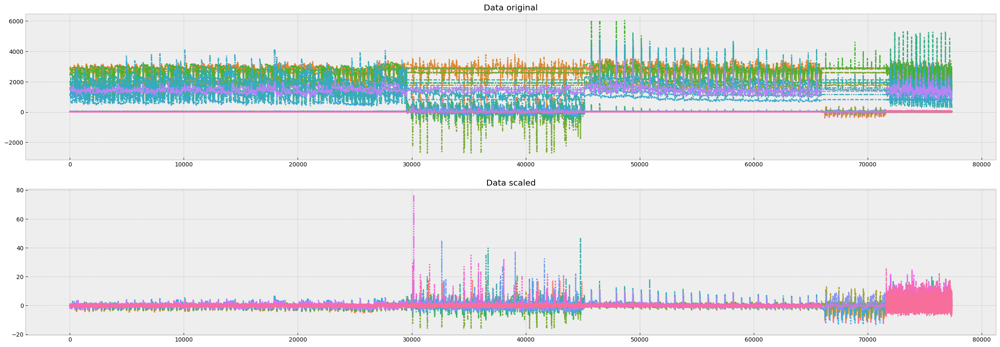

In [43]:
fig, ax = plt.subplots(2, 1, figsize=(30, 10))

sns.lineplot(X_train_conc, 
             legend=False, 
             ax=ax[0])
ax[0].set_title('Data original')


X_train_scaled, X_test_scaled = scale_data(X_train_conc, X_test_conc)

sns.lineplot(X_train_scaled, 
             legend=False, 
             ax=ax[1])
ax[1].set_title('Data scaled')


fig.show() 

### Feature selection

[2024-03-21 01:39:27.000610] Session with 50 features is done.
[2024-03-21 01:39:43.679100] Session with 49 features is done.
[2024-03-21 01:40:01.837752] Session with 48 features is done.
[2024-03-21 01:40:24.523158] Session with 47 features is done.
[2024-03-21 01:40:42.778926] Session with 46 features is done.
[2024-03-21 01:40:59.029664] Session with 45 features is done.
[2024-03-21 01:41:17.545967] Session with 44 features is done.
[2024-03-21 01:41:36.582049] Session with 43 features is done.
[2024-03-21 01:41:51.319499] Session with 42 features is done.
[2024-03-21 01:42:10.843260] Session with 41 features is done.
[2024-03-21 01:42:26.683292] Session with 40 features is done.
[2024-03-21 01:42:39.080329] Session with 39 features is done.
[2024-03-21 01:42:52.549710] Session with 38 features is done.
[2024-03-21 01:43:07.435112] Session with 37 features is done.
[2024-03-21 01:43:23.521053] Session with 36 features is done.
[2024-03-21 01:43:45.510986] Session with 35 features i

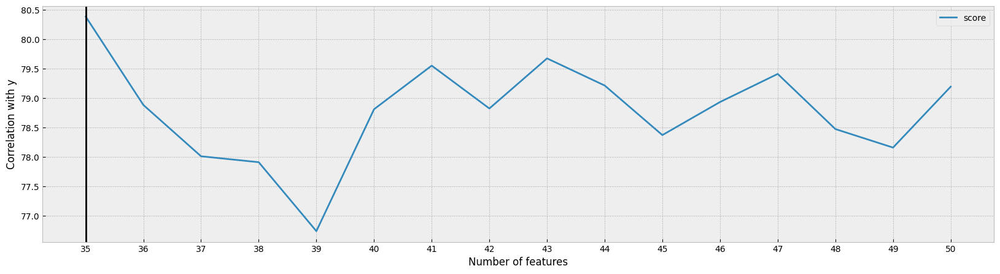

In [37]:
def select_features(Xy_set, model=model, plot=False):
    X_train, X_test, y_train, y_test = Xy_set
    
    noise_corr = pd.Series()
    y_bin = y_train.apply(binarise_y)

    for col in X_train.columns:    
        correlation = X_train[col].corr(y_bin)
        noise_corr.loc[col] = abs(correlation)

    noise_corr.sort_values(ascending=False, inplace=True)

    feature_scores = pd.DataFrame(columns=['features', 'score'])
    n_feats = noise_corr.shape[0]
    
    while n_feats > 0:
        features = noise_corr.iloc[:n_feats].index
        
        X_train_sel = X_train.loc[:, features]
        X_test_sel = X_test.loc[:, features]
        
        Xy_set_sel = (X_train_sel, X_test_sel, y_train, y_test)
        score = model_score(model, Xy_set_sel, 'test', False)
        
        if score < 50:
            break
        else:
            feature_scores.loc[n_feats, 'features'] = features
            feature_scores.loc[n_feats, 'score'] = score
            
            print(f'[{dt.now()}] Session with {n_feats} features is done.')
            n_feats -= 1
        
    best_features = list(feature_scores
                         .sort_values('score', ascending=False)
                         .iloc[0, 0])
    
    if plot:
        print(f'\nBest {len(best_features)} features: \n{best_features}')
        
        plt.figure(figsize=(20, 5))
        sns.lineplot(feature_scores)
        
        plt.xticks(np.arange(n_feats, noise_corr.shape[0])+1)
        plt.axvline(len(best_features), color='black')
        
        plt.xlabel('Number of features')
        plt.ylabel('Correlation with y')
        plt.show()
    
    return best_features


Xy_set_3 = (X_train_scaled, 
            X_test_scaled, 
            y_train_conc, 
            y_test_conc)

best_features = select_features(Xy_set_3, plot=True)

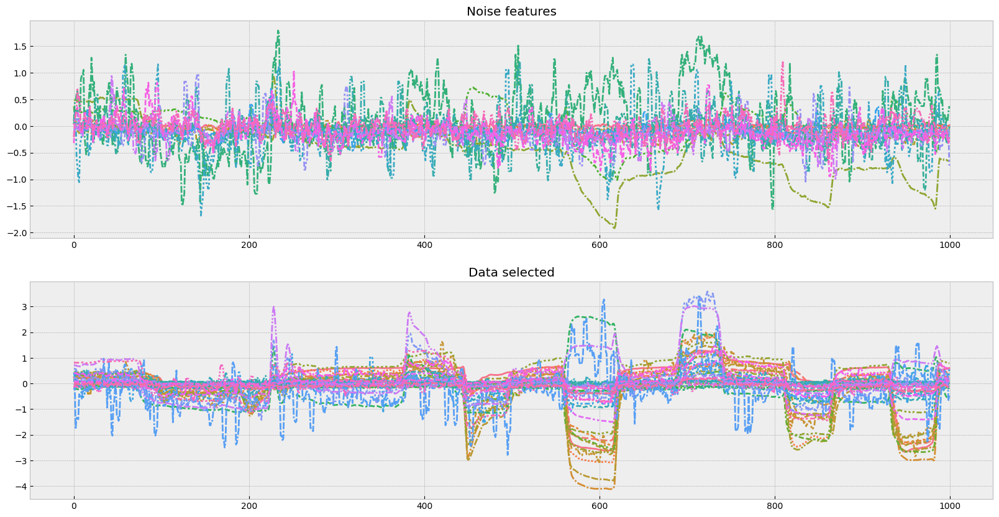

In [54]:
noisy_cols = (X_train_conc
              .drop(best_features, axis=1)
              .columns)


fig, ax = plt.subplots(2, 1, figsize=(20, 10))

sns.lineplot(X_train_scaled.iloc[:1000][noisy_cols], 
             legend=False, 
             ax=ax[0])
ax[0].set_title('Noise features')


X_train_selected = X_train_scaled[best_features]
X_test_selected = X_test_scaled[best_features]

sns.lineplot(X_train_selected.iloc[:1000], 
             legend=False, 
             ax=ax[1])
ax[1].set_title('Data selected')


fig.show()

In [55]:
Xy_set_4 = (X_train_selected, 
            X_test_selected, 
            y_train_conc, 
            y_test_conc)

selected_score = model_score(model, Xy_set_4, 'test')


print('Baseline score:', BASELINE_SCORE)
print('Properly concatenated score:', sorted_score)
print('Selected score:', selected_score)

Baseline score: 49.90217152147634
Properly concatenated score: 79.64206886078922
Selected score: 80.38283490675056


### Metrics

In [40]:
def get_f1(y, y_, sample):
    class_report = m.classification_report(
        y, y_, 
        target_names=GESTURES, 
        output_dict=True
    )
    
    scores_df = (
        pd.DataFrame(class_report)
        .loc['f1-score']
        .mul(100)
        .rename(sample)
    )
    
    return scores_df
    

def model_report(Xy_set, model=model, fitted=False):
    # FIT & PREDICT
    X_train, X_test, y_train, y_test = Xy_set
    
    if not fitted:
        model = fit_model(Xy_set, model)
    
    y_pred_train = model.predict(X_train).reshape(1, -1)[0]
    y_pred_test = model.predict(X_test).reshape(1, -1)[0]

    # EVALUATE
    nunq = lambda a: len(np.unique(a))
    
    if ((nunq(y_pred_train) != NUM_G) or
        (nunq(y_pred_test) != NUM_G)):
        raise ValueError('Bad prediction')
    
    train_f1_gest = get_f1(y_train, y_pred_train, 'train')
    test_f1_gest = get_f1(y_test, y_pred_test, 'test')
    
    scores = pd.concat([train_f1_gest, test_f1_gest], axis=1)
    
    y_train_df = pd.DataFrame({'y_train': y_train, 'y_pred_train': y_pred_train})
    y_test_df = pd.DataFrame({'y_test': y_test, 'y_pred_test': y_pred_test})
    
    # VISUALISE
    fig, ax = plt.subplots(3, 1, figsize=(20, 15))
    
    sns.lineplot(scores, markers=True, ax=ax[0])
    ax[0].axvline('macro avg', color='green')
    ax[0].axhline(100, color='black')
    ax[0].axhline(90, color='black')
    ax[0].set_title('Scores')
    
    sns.lineplot(y_train_df, ax=ax[1])
    ax[1].set_yticks(range(NUM_G), GESTURES)
    ax[1].set_title('Train')

    sns.lineplot(y_test_df, ax=ax[2])
    ax[2].set_yticks(range(NUM_G), GESTURES)
    ax[2].set_title('Test')

    fig.show()   

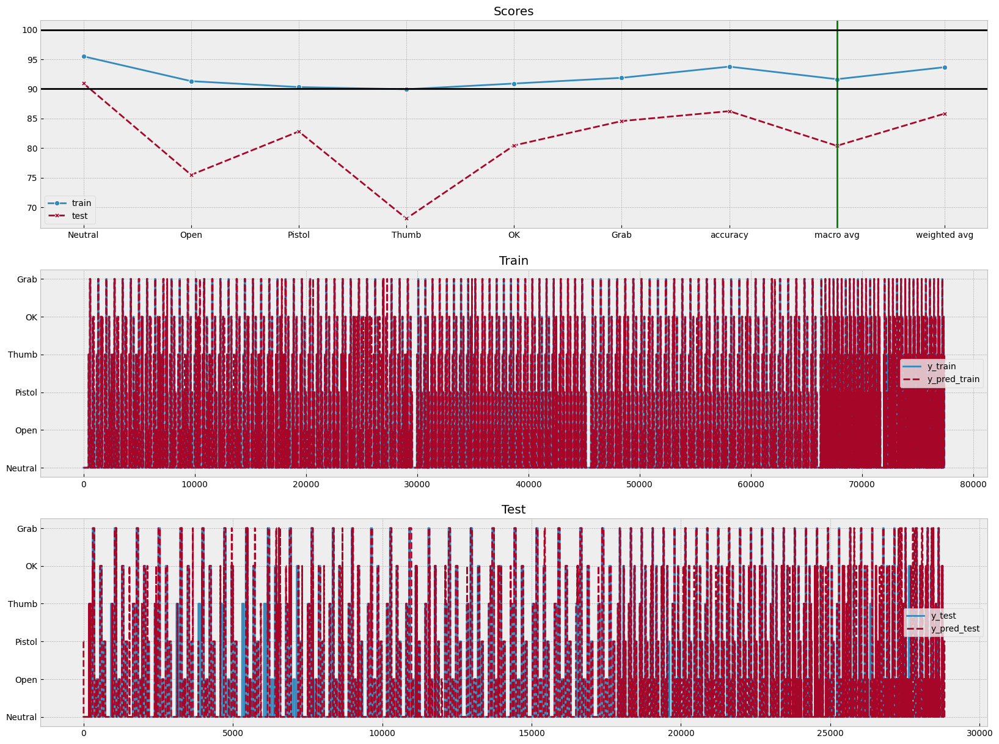

In [41]:
model_report(Xy_set_4)

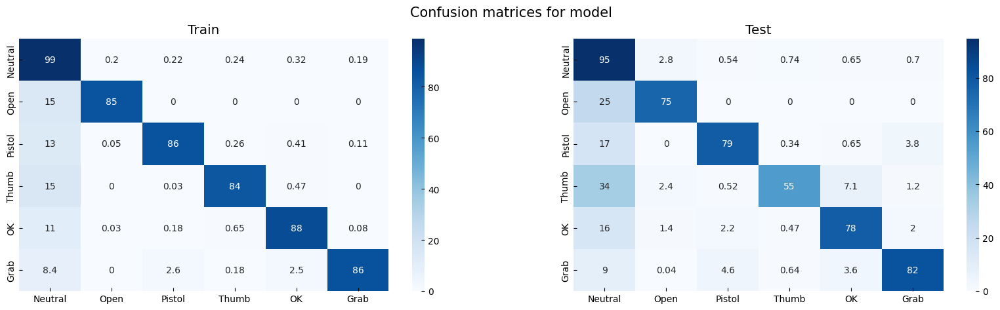

In [42]:
def show_confusion_matrix(Xy_set, model=model):
    X_train, X_test, y_train, y_test = Xy_set
    
    y_pred_train = model.predict(X_train).reshape(1, -1)[0]
    y_pred_test = model.predict(X_test).reshape(1, -1)[0]
    
    cm_train = m.confusion_matrix(y_train, 
                                  y_pred_train, 
                                  normalize='true')*100
    cm_test = m.confusion_matrix(y_test, 
                                 y_pred_test, 
                                 normalize='true')*100
    
    fig, ax = plt.subplots(1, 2, figsize=(20, 5))
    
    sns.heatmap(cm_train.round(2), 
                xticklabels=GESTURES, yticklabels=GESTURES,
                cmap='Blues', annot=True, ax=ax[0])
    ax[0].set_title('Train')
    
    sns.heatmap(cm_test.round(2), 
                xticklabels=GESTURES, yticklabels=GESTURES,
                cmap='Blues', annot=True, ax=ax[1])
    ax[1].set_title('Test')
    
    fig.suptitle('Confusion matrices for model', fontsize=15)
    fig.show()
    

show_confusion_matrix(Xy_set_4)

### Class weights tuning

In [85]:
def opt_class_weights(trial: optuna.trial.Trial):
    weights = {
        0: trial.suggest_float(0, 1e-4, 10), 
        1: trial.suggest_float(1, 1e-4, 10), 
        2: trial.suggest_float(2, 1e-4, 10), 
        3: trial.suggest_float(3, 1e-4, 10), 
        4: trial.suggest_float(4, 1e-4, 10), 
        5: trial.suggest_float(5, 1e-4, 10)
    }
    
    model = CatBoostClassifier(**params)
    model.set_params(class_weights=weights)
    
    model_opt = fit_model(Xy_set_4, model)
    score = model_score(model_opt, Xy_set_4, 'test')
    
    return score 


pruner = optuna.pruners.ThresholdPruner(upper=82)

cw_study = optuna.create_study(
    study_name='Class weights for CatBoost', 
    direction='maximize', 
    pruner=pruner
)
cw_study.optimize(opt_class_weights, n_trials=150)

[I 2024-03-20 23:41:22,919] A new study created in memory with name: Class weights for CatBoost
[I 2024-03-20 23:42:02,251] Trial 0 finished with value: 73.78184991680291 and parameters: {0: 1.772177322342179, 1: 5.318275101394532, 2: 6.556271848379471, 3: 0.6393308276669013, 4: 9.190416825557486, 5: 2.856143335909833}. Best is trial 0 with value: 73.78184991680291.
[I 2024-03-20 23:42:24,703] Trial 1 finished with value: 71.17609264608338 and parameters: {0: 9.226945667281557, 1: 2.5480156229412914, 2: 4.948046736302008, 3: 1.7243178003661104, 4: 7.9563739025688855, 5: 5.519343093121587}. Best is trial 0 with value: 73.78184991680291.
[I 2024-03-20 23:42:46,282] Trial 2 finished with value: 66.84794617195297 and parameters: {0: 7.323353291718777, 1: 0.7007615604747303, 2: 0.8920680047005959, 3: 7.451387516701384, 4: 4.155439251557817, 5: 7.357820936778819}. Best is trial 0 with value: 73.78184991680291.
[I 2024-03-20 23:42:47,399] Trial 3 finished with value: 0.0 and parameters: {0: 5

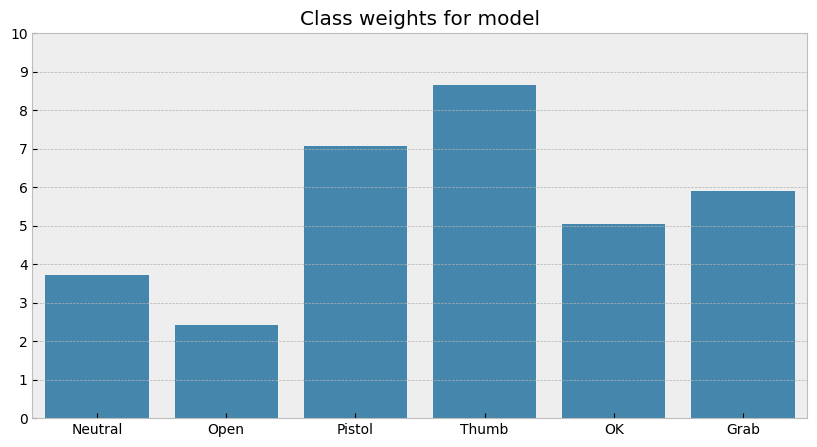

In [60]:
params['class_weights'] = cw_study.best_params

plt.figure(figsize=(10, 5))
sns.barplot(params['class_weights']) 

plt.xticks(range(NUM_G), GESTURES)
plt.yticks(range(11))

plt.title('Class weights for model')
plt.show()

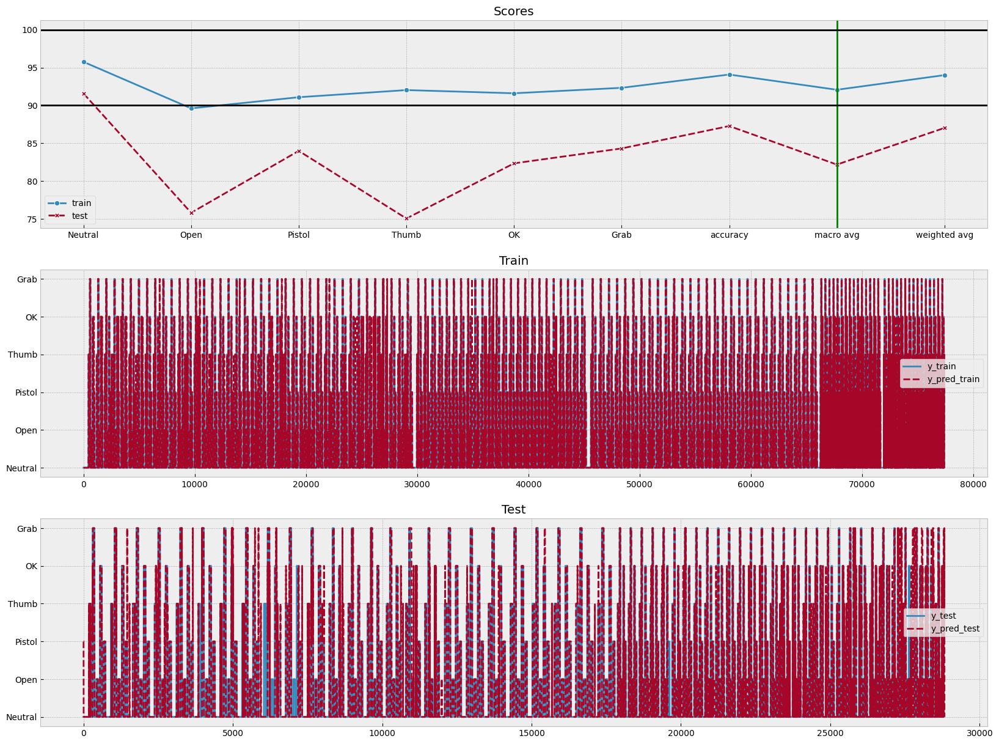

In [61]:
model = CatBoostClassifier(**params)

model_report(Xy_set_4, model)

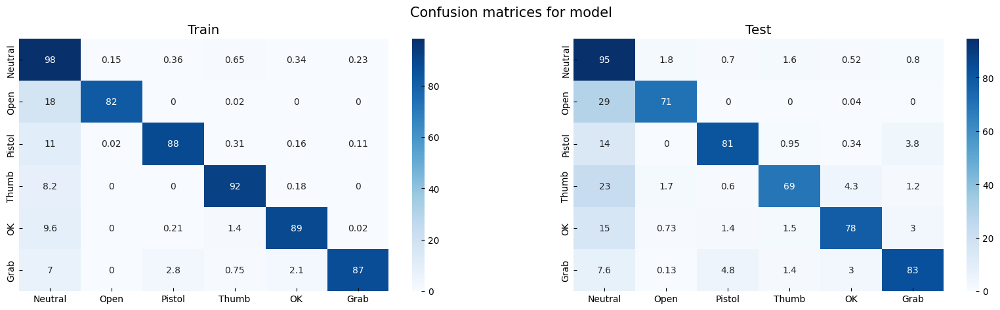

In [62]:
show_confusion_matrix(Xy_set_4, model) 

# Real-time inference

### Inference Utils

In [92]:
real_scaler = pp.StandardScaler()

def preprocessing(x):
    # x - sample vector  
    X = pd.DataFrame(x, columns=OMG_CH)
    X_smoothed = smoothe_data(X, best_win)
    
    real_scaler.partial_fit(X_smoothed)
    
    X_scaled = pd.DataFrame(
        real_scaler.transform(X_smoothed),
        columns=OMG_CH
    )
    
    X_selected = X_scaled[best_features]
    
    return X_selected.values


def inference(x, model):
    y = model.predict_proba([x])[0]
    
    return y


def postprocessing(x, prev):    
    if prev is None:
        y = x
    else:
        y = (x*0.1) + (prev*0.9) # Holt-Winters filter
        
    return y


def commands(x):
    x_am = x.argmax()
    x_cl = np.clip(x_am/100, 0, 1)
    
    y = np.rint(x_cl*100).astype(int)
    
    return y

### Offline (dataset)

In [64]:
palm_file = '2023-04-18_19-08-47 gestures train.palm'

gestures = read_omg_csv('./data/'+palm_file)
y_cmd = read_protocol_csv('./data/'+palm_file, gestures)

best_shift = data_scores.loc[palm_file, 'shift']
last_train_idx = train_test_split(
    palm_file, gestures, y_cmd, best_shift
)[-2]

df_sim = gestures.iloc[last_train_idx:]
y_sim = shift_targ(y_cmd.iloc[last_train_idx:], best_shift)

print(df_sim.shape)

(8060, 65)


In [94]:
TIMEOUT = 0.033
DEBUG = False
    
i = 0
ts_old = time.time()
ts_diff = 0

y_previous = None
y_dct = {
    'omg_sample': [],
    'enc_sample': [],
    'sample_preprocessed': [],
    'y_predicted': [],
    'y_postprocessed': [],
    'y_commands': [],
}


while True:    
    # [Data reading]
    ts_start = time.time()
    
    try:
        # [Sim data]
        if i < X_test.shape[0]:
            sample = df_sim.values[i]
        else:
            break
        
        [omg_sample, acc_sample, enc_sample, [button, sync, ts]] = np.array_split(sample, [50, 56, 62])

    except Exception as e:
        print(e)
    
    
    # [Data preprocessing]
    y_dct['omg_sample'].append(omg_sample)     
    sample_preprocessed = preprocessing(y_dct['omg_sample'][-10:])[-1]
    
    # [Inference]
    y_predicted = inference(sample_preprocessed, model)
    
    # [Inference Postprocessing]
    y_postprocessed = postprocessing(y_predicted, y_previous)
    
    # [Commands composition]
    y_commands = commands(y_postprocessed)
    
    # [Commands sending]
    # NO COMMANDS SENDING IN SIMULATION
    
    
    # [Data logging]
    y_dct['enc_sample'].append(enc_sample)
    y_dct['sample_preprocessed'].append(sample_preprocessed)
    y_dct['y_predicted'].append(y_predicted)
    y_dct['y_postprocessed'].append(y_postprocessed)
    y_dct['y_commands'].append(y_commands)

    y_previous = y_postprocessed
    
    if DEBUG:
        # sanity check: Sizes of SAMPLE=65, OMG=50, ACC=6, ENCODERS=6
        print(f'SAMPLE SIZE: {len(sample)}, OMG: {len(omg_sample)}, ACC: {len(acc_sample)}, ENCODERS: {len(enc_sample)}')
        print(f'BUTTON: {button}, SYNC: {sync}, TS: {ts}')
        print(y_commands)
        
        clear_output(wait=True)
    
    ts_diff = time.time() - ts_start
    assert ts_diff < TIMEOUT, f'Calculation cycle (iter №{i}) takes more than TIMEOUT, halting...'
    
    ts_old = ts_start
    i += 1 
    
    
for key, val in y_dct.items():
    y_dct[key] = np.stack(val)
    
    print(f"{key}.shape = {y_dct[key].shape}")

omg_sample.shape = (8060, 50)
enc_sample.shape = (8060, 6)
sample_preprocessed.shape = (8060, 35)
y_predicted.shape = (8060, 6)
y_postprocessed.shape = (8060, 6)
y_commands.shape = (8060,)


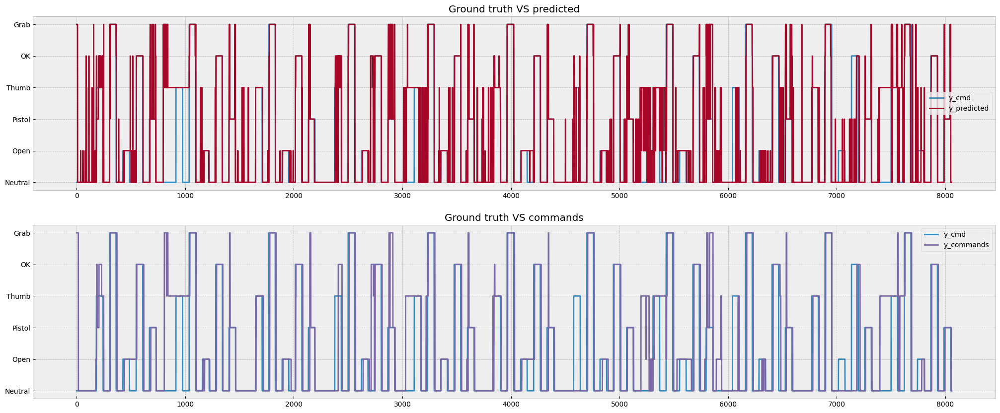

In [95]:
fig, ax = plt.subplots(2, 1, figsize=(25, 10))

sns.lineplot(y_sim.values, c='C0', label='y_cmd', ax=ax[0])
sns.lineplot(y_dct['y_predicted'].argmax(axis=1), c='C1', label='y_predicted', ax=ax[0])
ax[0].set_title('Ground truth VS predicted')

sns.lineplot(y_sim.values, c='C0', label='y_cmd', ax=ax[1])
#sns.lineplot(y_dct['y_postprocessed'].argmax(axis=1), c='C2', label='y_postprocessed', ax=ax[1])
sns.lineplot(y_dct['y_commands'], c='C2', label='y_commands', ax=ax[1])
ax[1].set_title('Ground truth VS commands')

ax[0].set_yticks(range(NUM_G), GESTURES)
ax[1].set_yticks(range(NUM_G), GESTURES)

fig.show()

In [96]:
print(m.classification_report(y_sim, y_dct['y_commands'], target_names=GESTURES)) 

              precision    recall  f1-score   support

     Neutral       0.85      0.74      0.79      4712
        Open       0.55      0.68      0.61       665
      Pistol       0.89      0.70      0.79       672
       Thumb       0.41      0.62      0.50       671
          OK       0.74      0.82      0.78       670
        Grab       0.72      0.89      0.79       670

    accuracy                           0.74      8060
   macro avg       0.69      0.74      0.71      8060
weighted avg       0.77      0.74      0.75      8060



### Online (prosthesis or virtual hand)

In [ ]:
crc_table = [
    54, 181, 83, 241, 89, 16, 164, 217, 34, 169, 220, 160, 11, 252,
    111, 241, 33, 70, 99, 240, 234, 215, 60, 206, 68, 126, 152, 81,
    113, 187, 14, 21, 164, 172, 251, 16, 248, 215, 236, 90, 49, 53,
    179, 156, 101, 55, 65, 130, 161, 22, 218, 79, 24, 168, 152, 205,
    115, 141, 23, 86, 141, 58, 122, 215, 252, 48, 69, 115, 138, 66,
    88, 37, 63, 104, 176, 46, 139, 246, 222, 184, 103, 92, 154, 174,
    97, 141, 195, 166, 227, 150, 140, 48, 121, 243, 13, 131, 210, 199,
    45, 75, 180, 104, 97, 82, 251, 90, 132, 111, 229, 175, 146, 216,
    153, 86, 166, 33, 184, 100, 225, 248, 186, 54, 89, 39, 2, 214, 2,
    114, 197, 6, 35, 188, 245, 64, 220, 37, 123, 132, 190, 60, 189, 53,
    215, 185, 238, 145, 99, 226, 79, 54, 102, 118, 210, 116, 51, 247,
    0, 191, 42, 45, 2, 132, 106, 52, 63, 159, 229, 157, 78, 165, 50,
    18, 108, 193, 166, 253, 3, 243, 126, 111, 199, 152, 36, 114, 147,
    57, 87, 14, 16, 160, 128, 97, 189, 51, 115, 142, 8, 70, 71, 55, 42,
    193, 65, 207, 122, 158, 26, 21, 72, 139, 33, 230, 230, 116, 134, 5,
    213, 165, 107, 41, 134, 219, 190, 26, 29, 136, 174, 190, 108, 185, 172,
    137, 239, 164, 208, 207, 206, 98, 207, 12, 0, 174, 64, 20, 90, 49, 12,
    67, 112, 109, 78, 114, 165, 244, 183, 121
]

    
def get_crc(data, count):
    result = 0x00
    l = count
    
    while count > 0:   
        result = crc_table[result ^ data[l-count]]
        count -= 1
        
    return result


def drv_abs_one(ser, control):
    if ser is None:
        return
    
    pack = np.array(([80, 0x01, 0xBB, 6] + 
                     [c for c in control] + 
                     [0]), 
                    dtype='uint8')
    pack[-1] = get_crc(pack[1:], 9)
    
    return pack, ser.write(bytearray(pack))

In [ ]:
ser = None
# ser_port = None
# ser_port = '/dev/ttyACM0'
ser_port = '/dev/cu.usbmodem3498365F31351'

if ser_port is not None:
    ser = serial.Serial(port=ser_port, timeout=2*TIMEOUT)
    ser.write('T1#\r\n'.encode('utf-8')) # T1 for Timestamp activate
    ser.write('M2#\r\n'.encode('utf-8')) # M2 for Mode == 2 = send samples
    ser.write('S2#\r\n'.encode('utf-8')) # SYNC to 2 for sanity check

    # flush buffers
    ser.reset_input_buffer()
    ser.read()
    
    i = 0;
    while(ser.in_waiting):
        print(f'Flushing buffers {i}: {ser.in_waiting}', end='    \r')
        ser.read_all()
        time.sleep(0.005)
        i+=1;
    ser.readline()
    ser.readline()
    
i = 0
ts_old = time.time()
ts_diff = 0;

y_previous = None
while True:    
    
    # [Data reading]
    s = ser.readline()
    ts_start = time.time()
    
    try:
        sample = np.array(s.decode('UTF-8')\
                           .replace('\r\n', "")\
                           .split(' ')
                         ).astype(int)
        [omg_sample, acc_sample, enc_sample, [button, sync, ts]] = np.array_split(sample, [50, 56, 62])
        
    except Exception as e:
        print(e)
    # [/Data Reading]
        
    # [Data preprocessing]
    sample_preprocessed = preprocessing(omg_sample)
    # [/Data preprocessing]
    
    # [Inference]
    y_predicted         = inference(sample_preprocessed)
    # [/Inference]
    
    # [Inference Postprocessing]
    y_postprocessed     = postprocessing(y_predicted, y_previous)
    # [/Inference Postprocessing]
    
    # [Commands composition]
    y_commands          = commands(y_postprocessed)
    # [/Commands composition]
    
    # [Commands sending]
    pack, _ = drv_abs_one(ser, list(y_commands)); # + [0]
    # [/Commands sending]
    
    y_previous = y_postprocessed
    
    if DEBUG:
        clear_output(wait=True)

        # sanity check: iteration should increase monotonically, TIMEDIFF approximately 32-34 ms, CYCLETIME < TIMEOUT, WAITING should be == 0
        print(f'ITERATION:\t{i}\tTIMEDIFF:\t{(ts_start - ts_old)*1000: .0f}\tCYCLETIME:\t{ts_diff*1000:.0f}\tWAITING:\t{ser.in_waiting}')
        print('INPUT:\n', s)

        # sanity check: Sizes of SAMPLE=65, OMG=50, ACC=6, ENCODERS=6
        print(f'SAMPLE SIZE: {len(sample)}, OMG: {len(omg_sample)}, ACC: {len(acc_sample)}, ENCODERS: {len(enc_sample)}')
        print(f'BUTTON: {button}, SYNC: {sync}, TS: {ts}')
        print(y_commands)
        print(pack)
    
    ts_diff = time.time() - ts_start
    assert(ts_diff<TIMEOUT), 'Calculation cycle takes more than TIMEOUT, halting...'
    ts_old = ts_start
    i += 1 

AttributeError: module 'serial' has no attribute 'Serial'